В качестве наиболее удобного примера возьмём наиболее контрастную фотографию стула 

In [2]:
from matplotlib import pyplot as plt
from imageio import imread, imsave
from skimage.color import rgb2gray
import numpy as np
from skimage.feature import canny
from skimage.filters import try_all_threshold
from skimage.filters import gaussian
from skimage.filters import threshold_otsu, rank
from skimage.filters import threshold_triangle
from skimage.morphology import disk
from skimage.morphology import binary_closing
from skimage.morphology import binary_opening
from skimage.util import img_as_ubyte
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line
import cv2
from scipy.ndimage.morphology import binary_fill_holes
from matplotlib.patches import Rectangle

dataset_path = "..\\Big_Lab\\dataset"

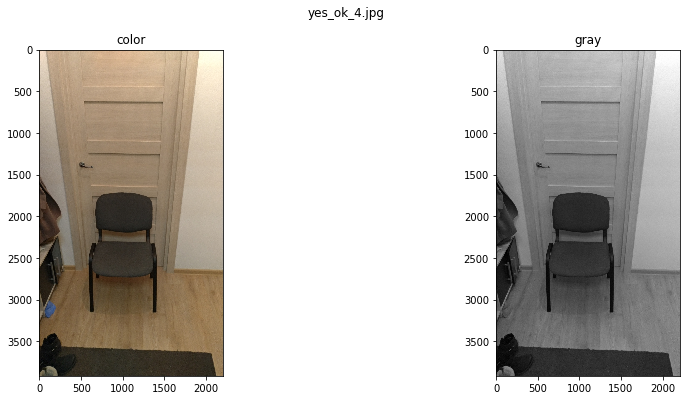

In [3]:
name = "yes_ok_4.jpg"
data_img = imread("%s\\%s" % (dataset_path, name))
data_img_gray = rgb2gray(data_img)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle("%s" % name)
ax[0].set_title('color')
ax[0].imshow(data_img)
ax[1].set_title('gray')
ax[1].imshow(data_img_gray, cmap='gray')

применим метод Canny

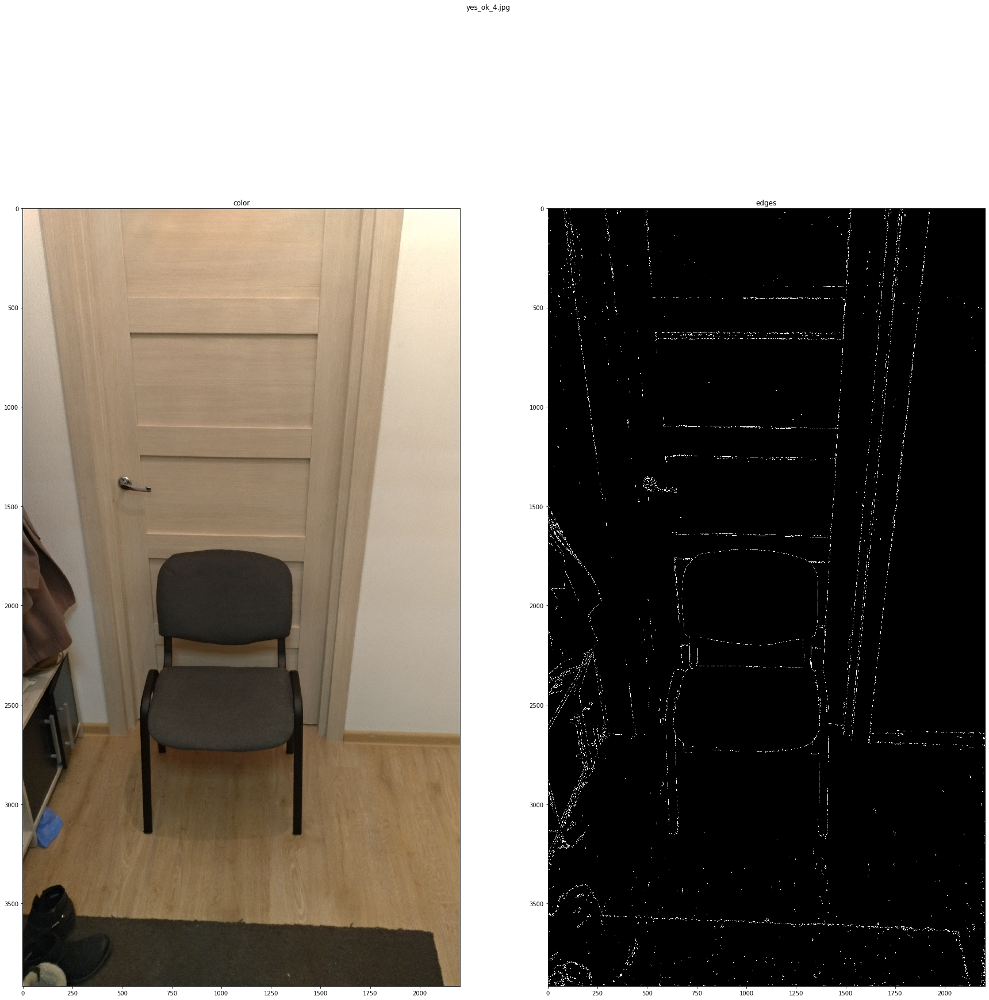

In [4]:
data_img = imread("%s\\%s" % (dataset_path, name))
edges = canny(data_img_gray, sigma=0.5)
fig, ax = plt.subplots(1, 2, figsize=(30, 30))
fig.suptitle("%s" % name)
ax[0].set_title('color')
ax[1].set_title('edges')
ax[0].imshow(data_img)
ax[1].imshow(edges, cmap="gray")


видны очертания стула и двери, но они сложно различимы

для выделения стула попытаемся бинаризовать изображения

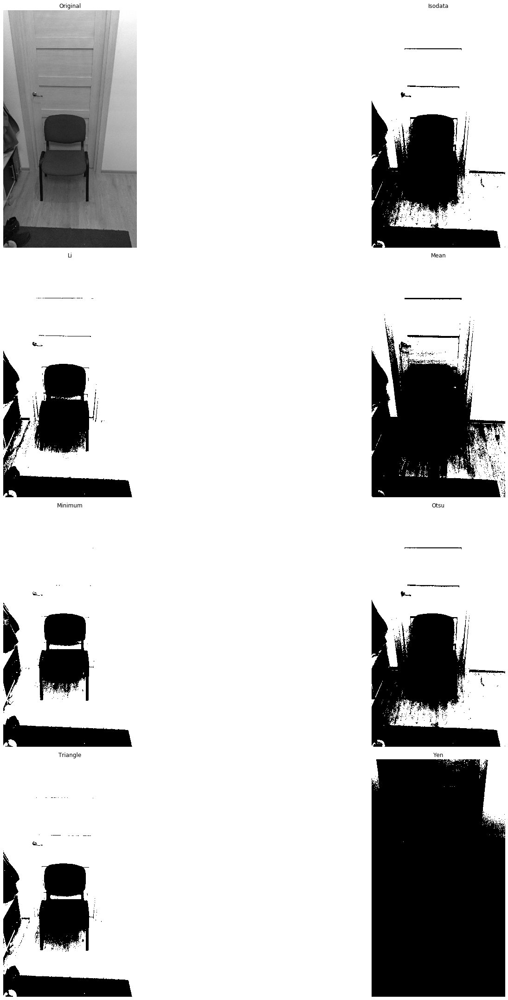

In [5]:
data_img = imread("%s\\%s" % (dataset_path, name))
fig, ax = try_all_threshold(rgb2gray(data_img), figsize=(30, 30), verbose=False)
plt.show()

Лучше всего выглядит minimum и triangle

выделим границы используя локальный thesh_hold

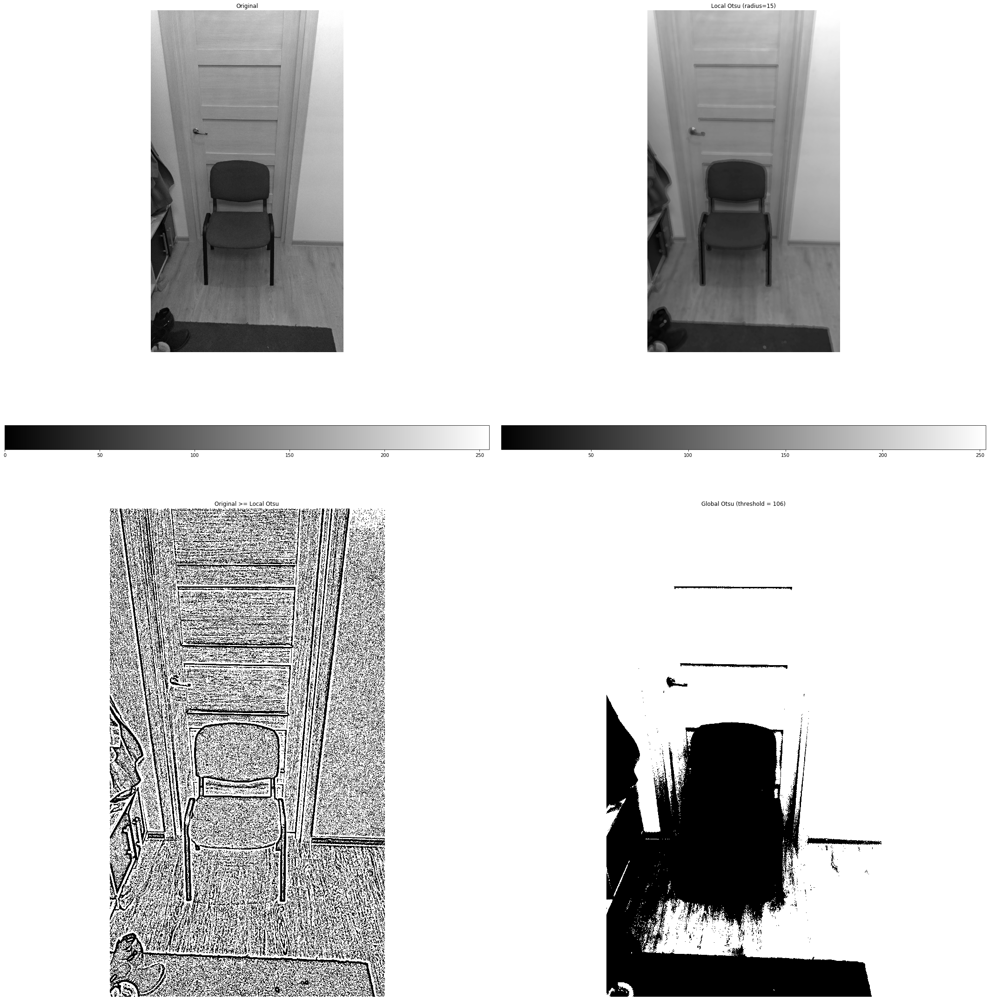

In [6]:
data_img = imread("%s\\%s" % (dataset_path, name))
data_img_gray = rgb2gray(data_img)
img = img_as_ubyte(data_img_gray)
radius = 15
selem = disk(radius)
local_otsu = rank.otsu(img, selem)
threshold_global_otsu = threshold_otsu(img)
global_otsu = img >= threshold_global_otsu

fig, ax = plt.subplots(2, 2, figsize=(30, 30), sharex=True, sharey=True)
ax0, ax1, ax2, ax3 = ax.ravel()
plt.tight_layout()

fig.colorbar(ax0.imshow(img, cmap=plt.cm.gray),
             ax=ax0, orientation='horizontal')
ax0.set_title('Original')
ax0.axis('off')

fig.colorbar(ax1.imshow(local_otsu, cmap=plt.cm.gray),
             ax=ax1, orientation='horizontal')
ax1.set_title('Local Otsu (radius=%d)' % radius)
ax1.axis('off')

img_local_otsu = img >= local_otsu
ax2.imshow(img_local_otsu, cmap=plt.cm.gray)
ax2.set_title('Original >= Local Otsu' % threshold_global_otsu)
ax2.axis('off')

ax3.imshow(global_otsu, cmap=plt.cm.gray)
ax3.set_title('Global Otsu (threshold = %d)' % threshold_global_otsu)
ax3.axis('off')

plt.show()

нет смысла "размывать" изображение, лучше восмользоваться морфологическими функциями

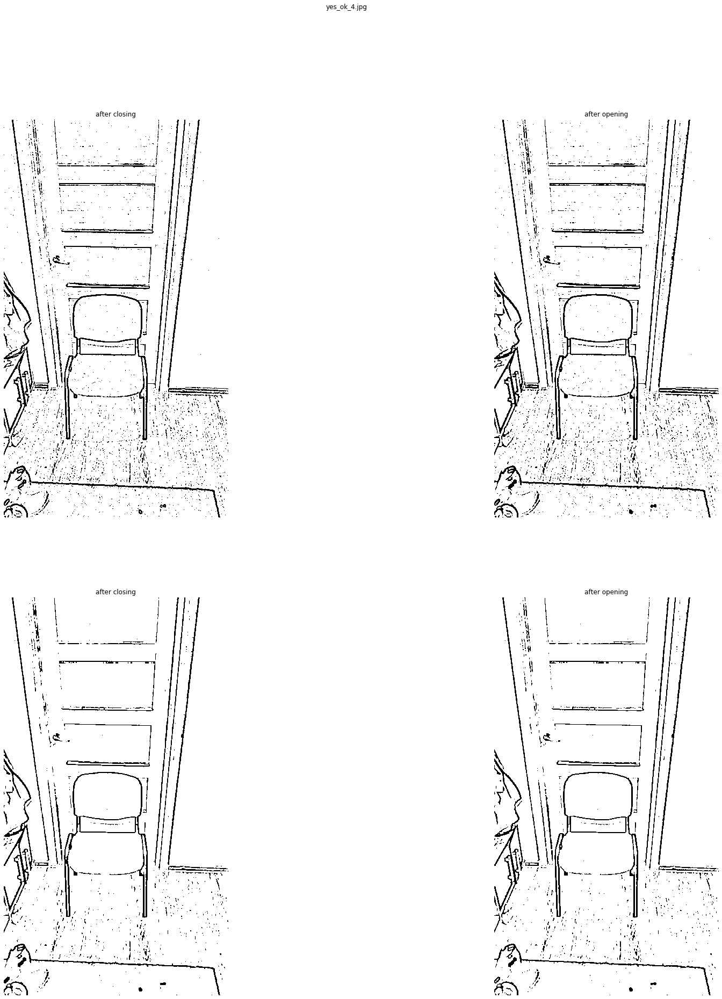

In [7]:
tmp_img = img_local_otsu


tmp_res_otsu_close = binary_closing(tmp_img, selem=np.ones((5, 5)))
tmp_res_otsu_open = binary_opening(tmp_res_otsu_close, selem=np.ones((7, 7)))


fig, ax = plt.subplots(2, 2, figsize=(30, 30))
ax0, ax1, ax2, ax3 = ax.ravel()
fig.suptitle("%s" % name)
ax0.axis('off')
ax1.axis('off')
ax0.set_title("after closing")
ax1.set_title("after opening")
ax0.imshow(tmp_res_otsu_close, cmap="gray")
ax1.imshow(tmp_res_otsu_open, cmap="gray")


img_local_otsu_blur = gaussian(tmp_res_otsu_open, sigma=0.5, multichannel=True)

tmp_res_otsu_open_2 = binary_closing(img_local_otsu_blur, selem=np.ones((5, 5)))
tmp_res_otsu_close_2 = binary_opening(tmp_res_otsu_open_2, selem=np.ones((10, 10)))

ax2.axis('off')
ax3.axis('off')
ax2.set_title("after closing")
ax3.set_title("after opening")
ax2.imshow(tmp_res_otsu_close_2, cmap="gray")
ax3.imshow(tmp_res_otsu_open_2, cmap="gray")
plt.show()

img_res_otsu_morph = tmp_res_otsu_open

повторим теже действия, но уже для "blur" изображения

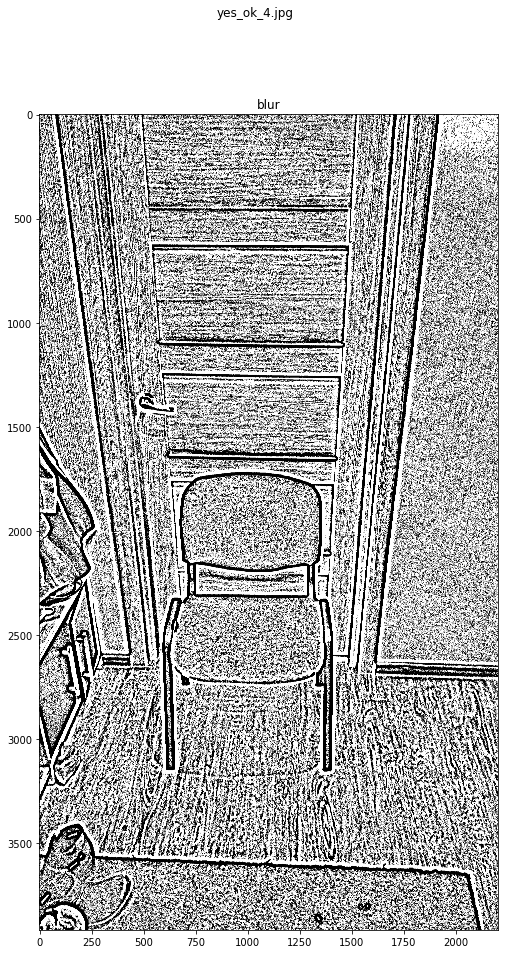

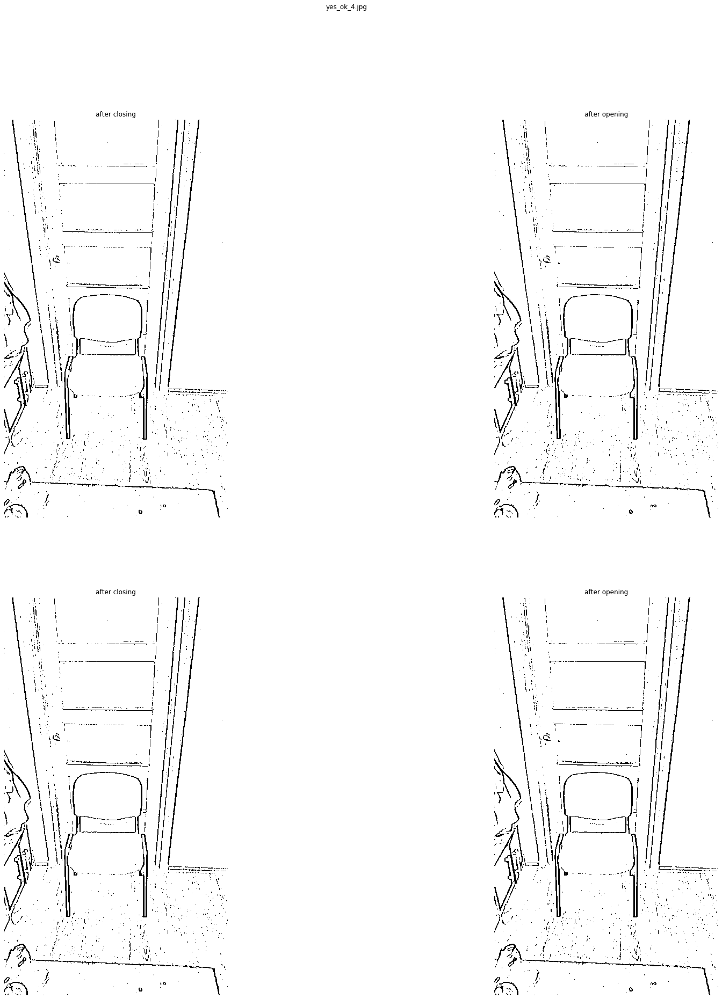

In [8]:



img_local_otsu_blur = gaussian(img_local_otsu, sigma=0.9, multichannel=True)

fig, ax = plt.subplots(1, 1, figsize=(15, 15))
fig.suptitle("%s" % name)
ax.set_title('blur')
ax.imshow(img_local_otsu_blur, cmap="gray")
plt.show()

tmp_img = img_local_otsu_blur
tmp_res_otsu_close = binary_closing(tmp_img, selem=np.ones((3, 3)))
tmp_res_otsu_open = binary_opening(tmp_res_otsu_close, selem=np.ones((5, 5)))


fig, ax = plt.subplots(2, 2, figsize=(30, 30))
ax0, ax1, ax2, ax3 = ax.ravel()
fig.suptitle("%s" % name)
ax0.axis('off')
ax1.axis('off')
ax0.set_title("after closing")
ax1.set_title("after opening")
ax0.imshow(tmp_res_otsu_close, cmap="gray")
ax1.imshow(tmp_res_otsu_open, cmap="gray")

tmp_res_otsu_open_2 = binary_closing(tmp_res_otsu_open, selem=np.ones((7, 7)))
tmp_res_otsu_close_2 = binary_opening(tmp_res_otsu_open_2, selem=np.ones((10, 10)))

ax2.axis('off')
ax3.axis('off')
ax2.set_title("after closing")
ax3.set_title("after opening")
ax2.imshow(tmp_res_otsu_close, cmap="gray")
ax3.imshow(tmp_res_otsu_open, cmap="gray")
plt.show()
img_res_otsu_blur_morph = tmp_res_otsu_open

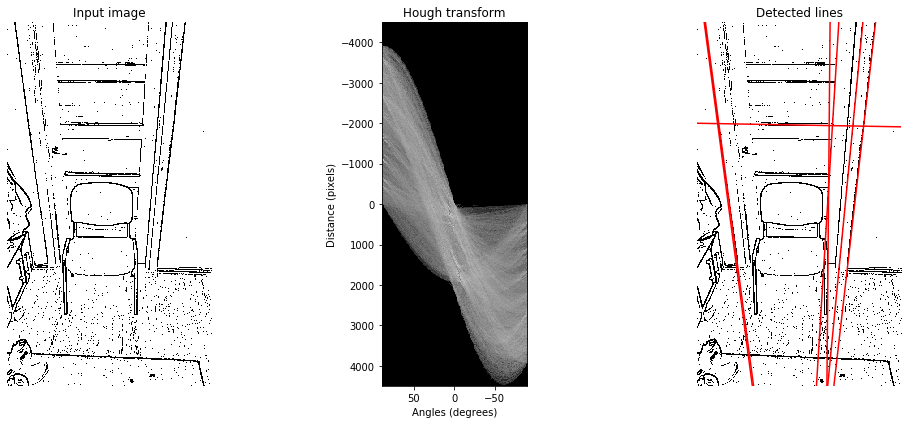

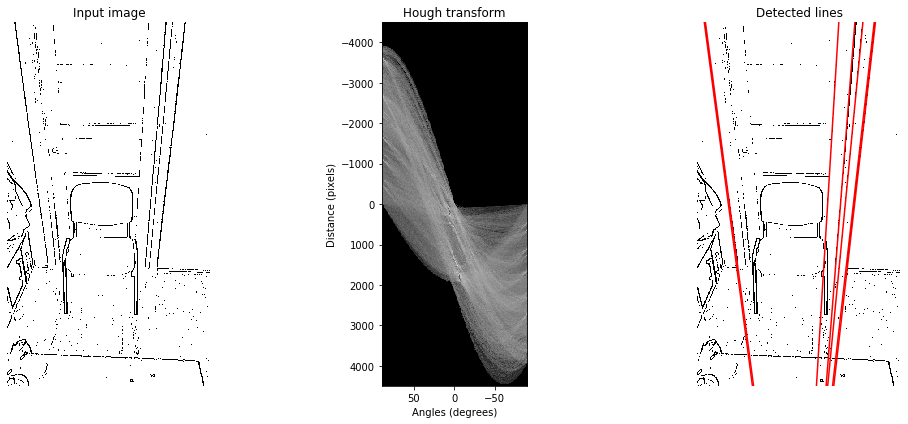

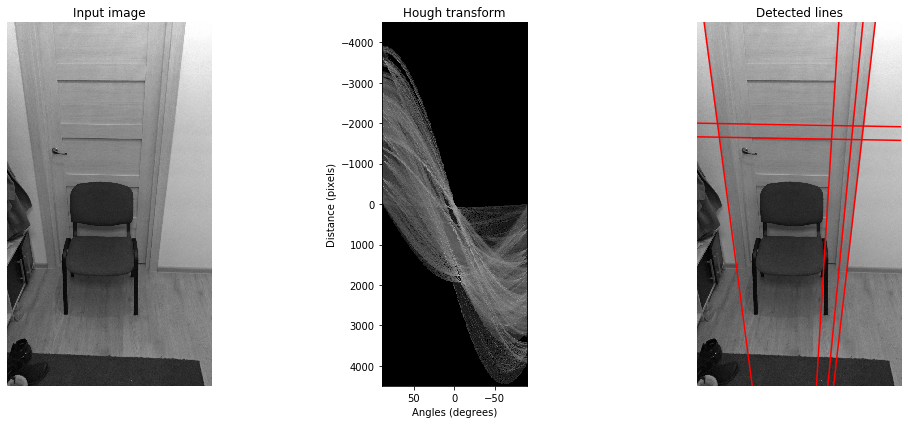

In [9]:
def show_hough_transform(image):
    h, theta, d = hough_line(canny(image)) # вычисляем преобразование Хаффа от границ изображения

    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    ax[0].imshow(image, cmap="gray")
    ax[0].set_title('Input image')
    ax[0].set_axis_off()

    ax[1].imshow(np.log(1 + h),
                 extent=[np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
                 cmap='gray', aspect=1/20)
    ax[1].set_title('Hough transform')
    ax[1].set_xlabel('Angles (degrees)')
    ax[1].set_ylabel('Distance (pixels)')

    ax[2].imshow(image, cmap="gray")
    for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
        y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
        y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
        ax[2].plot((0, image.shape[1]), (y0, y1), '-r')
    ax[2].set_xlim((0, image.shape[1]))
    ax[2].set_ylim((image.shape[0], 0))
    ax[2].set_axis_off()
    ax[2].set_title('Detected lines')

    plt.tight_layout()
    plt.show()
    
show_hough_transform(img_res_otsu_morph)
show_hough_transform(img_res_otsu_blur_morph)
show_hough_transform(data_img_gray)

Видим, что хоть Хаф и выделил прямые, сложно определить какие из них относятся конкретно к дверному проёму

Можно попробовоть искать линию стена-пол для оределения нижней границы двери

Разметим на похожей фотографях отдельно стул и дверь

In [18]:
def get_border(mask):
    vertical_indices = np.where(np.any(mask, axis=1))[0]
    top, bottom = vertical_indices[0], vertical_indices[-1]
    horizontal_indices = np.where(np.any(mask, axis=0))[0]
    left, right = horizontal_indices[0], horizontal_indices[-1]
    corner = (left, top)
    height = bottom - top
    width = right - left
    rect_border = Rectangle(corner, width, height, linewidth=5, edgecolor='b', facecolor='none')
    return rect_border

def crop_by_border(img, border):
    return img[border[0] : border[1], border[2] : border[3]]

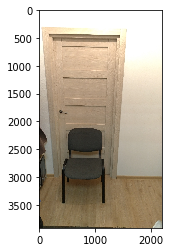

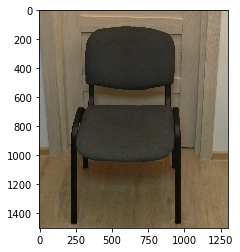

0.25513866421568626


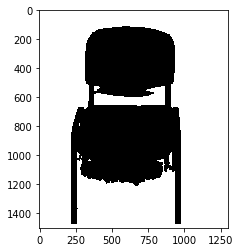

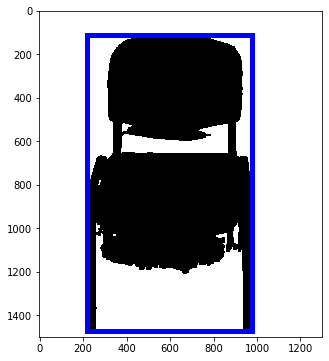

[2112, 3474, 419, 1176]


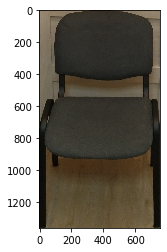

In [19]:
chair_name = "yes_ok_1.jpg"
chair_img = imread("%s\\%s" % (dataset_path, chair_name))
plt.imshow(chair_img)
plt.show()
first_border = [2000, 3500, 200, 1500]
chair_img_crop = crop_by_border(chair_img, first_border)
plt.imshow(chair_img_crop)
plt.show()
chair_img_crop_gray = rgb2gray(chair_img_crop)
thresh= threshold_triangle(chair_img_crop_gray)
print(thresh)
chair_img_crop_gray_binary = chair_img_crop_gray > thresh
chair_img_crop_gray_binary = binary_opening(chair_img_crop_gray_binary, selem=np.ones((5, 5)))
chair_img_crop_gray_binary = binary_closing(chair_img_crop_gray_binary, selem=np.ones((10, 10)))

plt.imshow(chair_img_crop_gray_binary, cmap="gray")
plt.show()



fig, ax = plt.subplots(1, 1, figsize=(15, 6))
ax.imshow(chair_img_crop_gray_binary, cmap='gray')
border = get_border(1 - chair_img_crop_gray_binary)
ax.add_patch(border)
plt.show()

chair_border = [first_border[0] + border.get_y(), first_border[0] + border.get_y() + border.get_height(), first_border[2] + border.get_x(), first_border[2] + border.get_x() + border.get_width()]
print(chair_border)
selected_chair = crop_by_border(chair_img, chair_border)

plt.imshow(selected_chair)
plt.show()

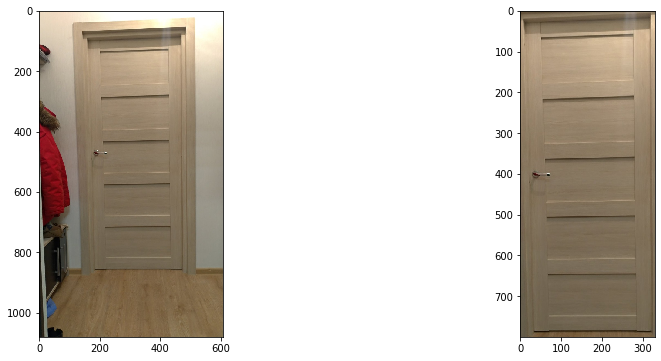

In [20]:
door_name = "door_only.jpg"
door_img = imread("%s\\%s" % (dataset_path, door_name))
door_border = [70, 870, 150, 480]
door_img_crop = crop_by_border(door_img, door_border)

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].imshow(door_img)
ax[1].imshow(door_img_crop)
plt.show()

selected_door = door_img_crop



In [30]:
def my_findHomography(img_1, img_2):
    img_1_gray = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
    img_2_gray = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')

    orb_detector = cv2.ORB_create(5000)

    kp1, d1 = orb_detector.detectAndCompute(img_1_gray, None)
    kp2, d2 = orb_detector.detectAndCompute(img_2_gray, None)

    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(d1, d2)
    matches_length = len(matches)
    p1 = np.zeros((matches_length, 2))
    p2 = np.zeros((matches_length, 2))
    for i in range(matches_length):
        p1[i, :] = kp1[matches[i].queryIdx].pt
        p2[i, :] = kp2[matches[i].trainIdx].pt

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[0].plot(p1[:, 0], p1[:, 1], "o")

    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')
    ax[1].plot(p2[:, 0], p2[:, 1], "o")

    homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
    return homography, mask

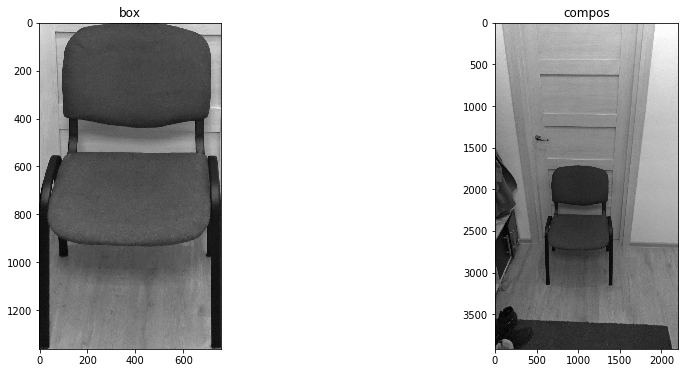

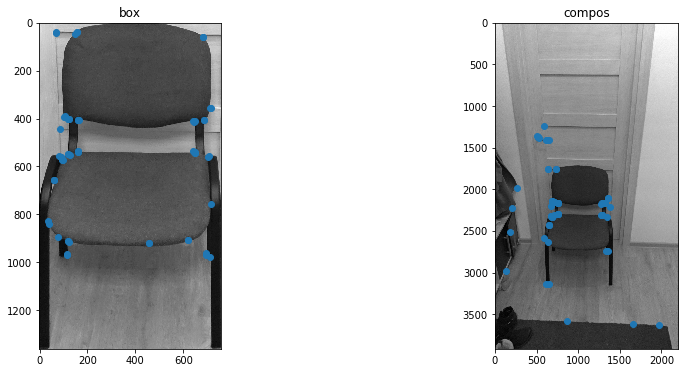

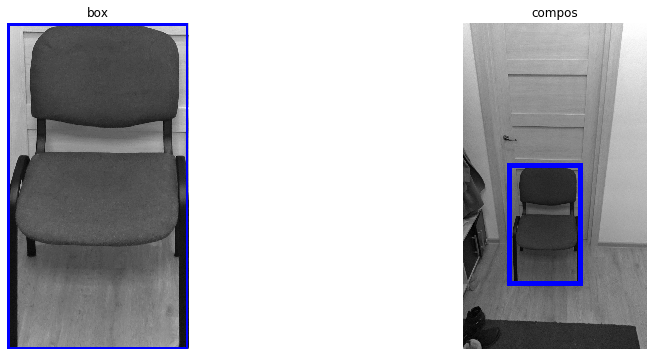

In [31]:
chair_box = cv2.imread("%s\\%s" % (dataset_path, "yes_ok_1.jpg"))
chair_box = crop_by_border(chair_box, chair_border)
compos = cv2.imread("%s\\%s" % (dataset_path, "yes_ok_4.jpg"))

chair_box_gray = cv2.cvtColor(chair_box, cv2.COLOR_BGR2GRAY)
chair_compos_gray = cv2.cvtColor(compos, cv2.COLOR_BGR2GRAY)
compos_height, compos_width = chair_compos_gray.shape

homography, mask = my_findHomography(chair_box, compos)
chair_box_white = np.ones(chair_box.shape)
chair_transformed_mask = cv2.warpPerspective(chair_box_white, homography, (compos_width, compos_height))
chair_transformed_img = cv2.warpPerspective(chair_box, homography, (compos_width, compos_height))

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].set_title('box')
ax[0].axis('off')
ax[0].imshow(chair_box_gray, cmap='gray')
border = get_border(chair_box_white)
ax[0].add_patch(border)

ax[1].set_title('compos')
ax[1].axis('off')
ax[1].imshow(chair_compos_gray, cmap='gray')
border = get_border(chair_transformed_mask)
ax[1].add_patch(border)

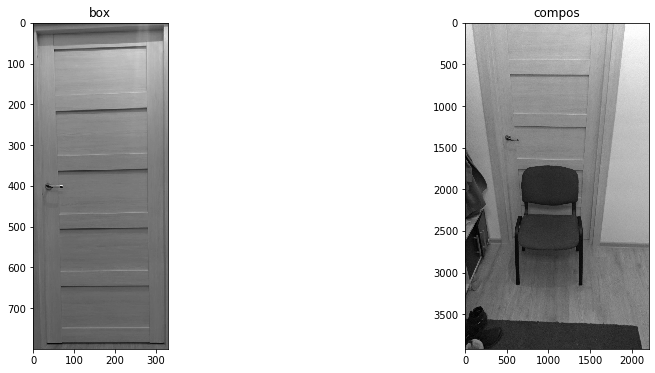

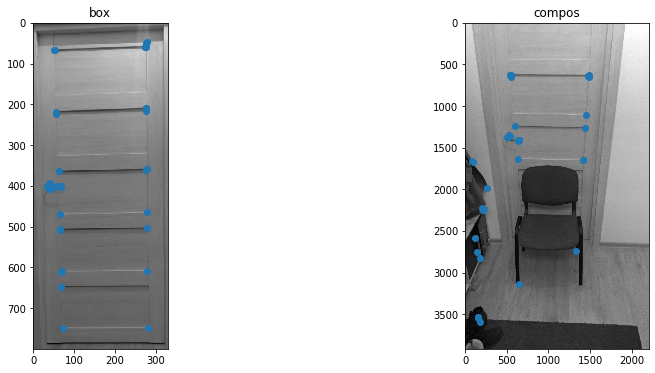

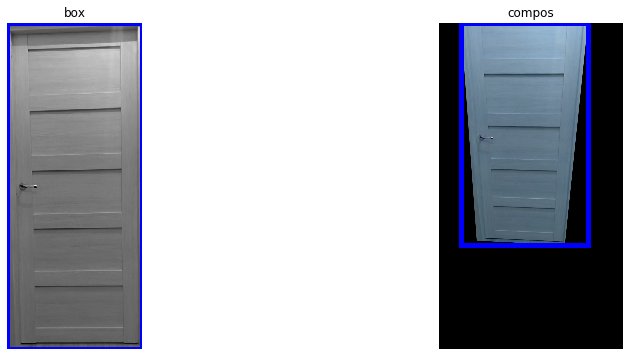

In [36]:
    
door_box = cv2.imread("%s\\%s" % (dataset_path, "door_only.jpg"))
door_box = crop_by_border(door_box, door_border)
compos = cv2.imread("%s\\%s" % (dataset_path, "yes_ok_4.jpg"))

door_box_gray = cv2.cvtColor(door_box, cv2.COLOR_BGR2GRAY)
compos_gray = cv2.cvtColor(compos, cv2.COLOR_BGR2GRAY)
copmos_height, copmos_width = compos_gray.shape
homography, mask  = my_findHomography(door_box, compos)
door_box_white = np.ones(door_box.shape)
door_transformed_mask = cv2.warpPerspective(door_box_white, homography, (copmos_width, copmos_height))
door_transformed_img = cv2.warpPerspective(door_box, homography, (copmos_width, copmos_height))

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].set_title('box')
ax[0].axis('off')
ax[0].imshow(door_box_gray, cmap="gray")
border = get_border(door_box_white)
ax[0].add_patch(border)

ax[1].set_title('compos')
ax[1].axis('off')
ax[1].imshow(door_transformed_img, cmap="gray")
border = get_border(door_transformed_mask)
ax[1].add_patch(border)

Знаем где дверь на входном изображении.

С помощью обратного преобразования переведём найдённую дверь и стул в про-во без перспективы


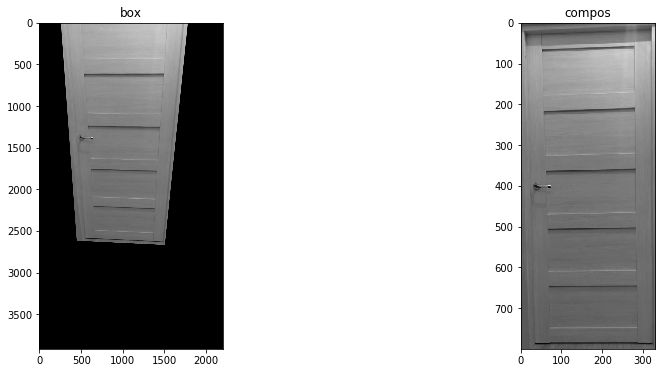

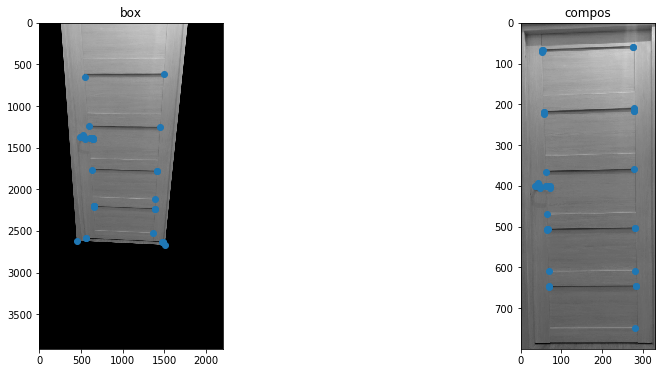

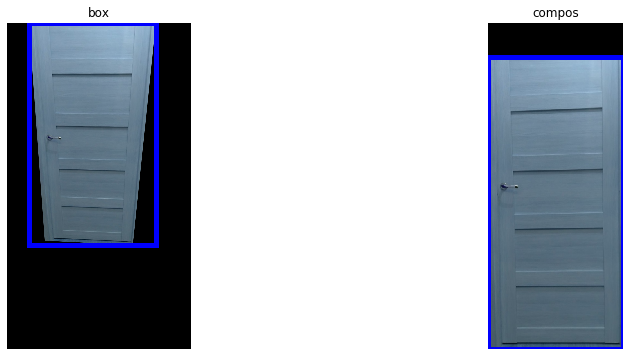

In [33]:
height, width = door_box_gray.shape

homography, mask = my_findHomography(door_transformed_img, door_box)
door_non_perspective_mask = cv2.warpPerspective(door_transformed_mask, homography, (width, height))
door_non_perspective_img = cv2.warpPerspective(door_transformed_img, homography, (width, height))

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].set_title('box')
ax[0].axis('off')
ax[0].imshow(door_transformed_img)
border = get_border(door_transformed_mask)
ax[0].add_patch(border)

ax[1].set_title('compos')
ax[1].axis('off')
ax[1].imshow(door_non_perspective_img)
door_non_perspective_border = get_border(door_non_perspective_mask)
ax[1].add_patch(door_non_perspective_border)


#chair_transformed_img

теперь применим это преобразование к стулу

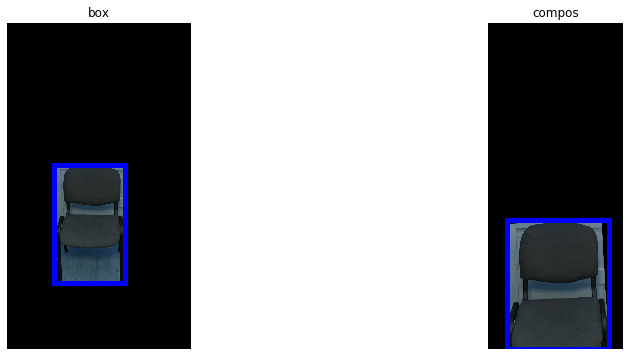

In [34]:
chair_non_perspective_mask = cv2.warpPerspective(chair_transformed_mask, homography, (width, height))
chair_non_perspective_img = cv2.warpPerspective(chair_transformed_img, homography, (width, height))

fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].set_title('box')
ax[0].axis('off')
ax[0].imshow(chair_transformed_img, cmap='gray')
border = get_border(chair_transformed_mask)
ax[0].add_patch(border)

ax[1].set_title('compos')
ax[1].axis('off')
ax[1].imshow(chair_non_perspective_img, cmap='gray')
chair_non_perspective_border = get_border(chair_non_perspective_mask)
ax[1].add_patch(chair_non_perspective_border)



Yes


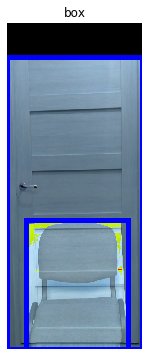

In [35]:
fig, ax = plt.subplots(1, 1, figsize=(15, 6))
ax.set_title('box')
ax.axis('off')

ax.imshow(chair_non_perspective_img + door_non_perspective_img, cmap='gray')
chair_non_perspective_border = get_border(chair_non_perspective_mask)
ax.add_patch(chair_non_perspective_border)
door_non_perspective_border = get_border(door_non_perspective_mask)
ax.add_patch(door_non_perspective_border)

if(door_non_perspective_border.get_width() > chair_non_perspective_border.get_width()):
    print("Yes")
else:
    print("No")

Сейчас не учитывается часть стула, за пределами двери.

Также есть допущение, что стул может непролезать только по ширине, по высоте ни проверяем

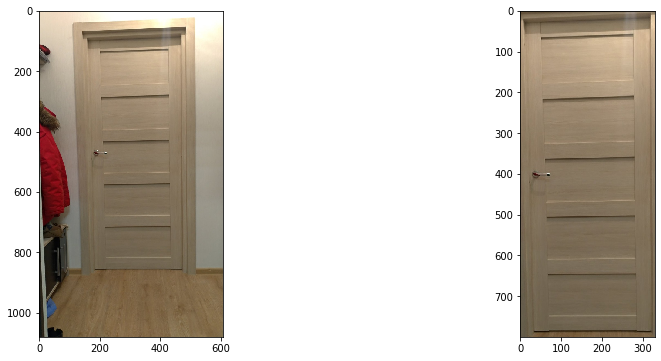

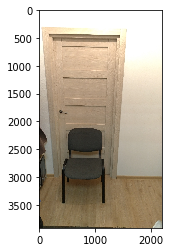

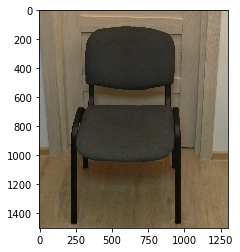

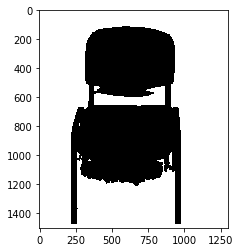

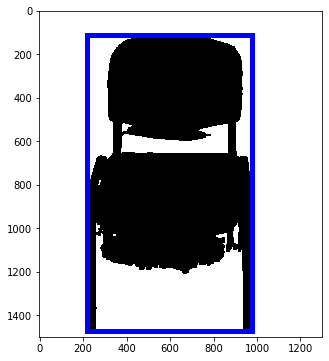

...

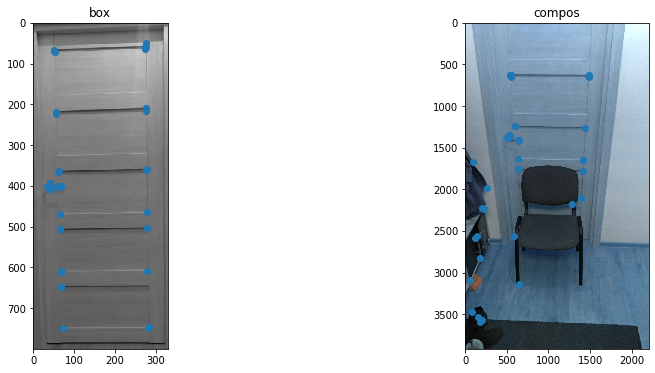

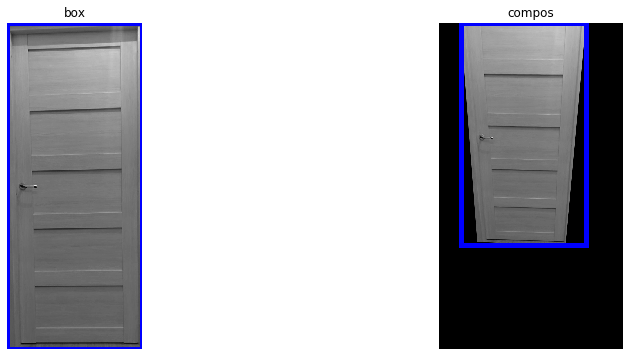

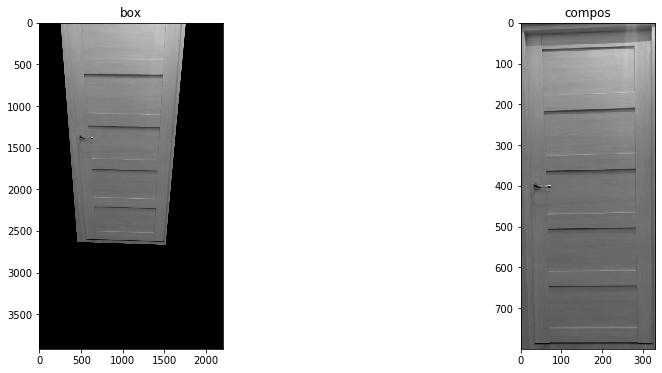

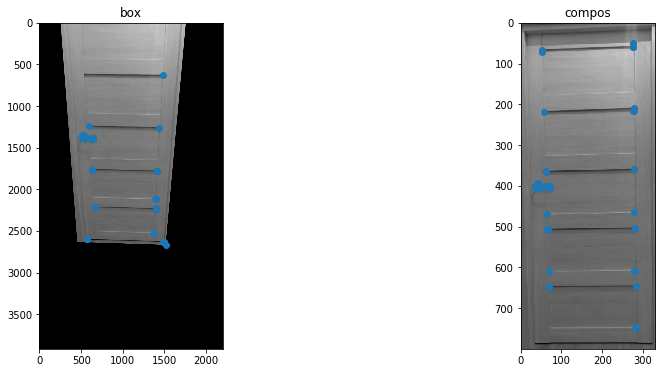

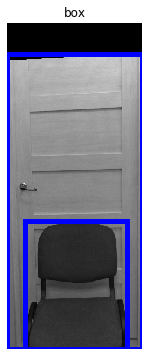

Yes : yes_ok_4.jpg


In [41]:
from matplotlib import pyplot as plt
from imageio import imread, imsave
from skimage.color import rgb2gray
import numpy as np
from skimage.feature import canny
from skimage.filters import try_all_threshold
from skimage.filters import gaussian
from skimage.filters import threshold_otsu, rank
from skimage.filters import threshold_triangle
from skimage.morphology import disk
from skimage.morphology import binary_closing
from skimage.morphology import binary_opening
from skimage.util import img_as_ubyte
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line
import cv2
from scipy.ndimage.morphology import binary_fill_holes
from matplotlib.patches import Rectangle

def get_border(mask):
    vertical_indices = np.where(np.any(mask, axis=1))[0]
    top, bottom = vertical_indices[0], vertical_indices[-1]
    horizontal_indices = np.where(np.any(mask, axis=0))[0]
    left, right = horizontal_indices[0], horizontal_indices[-1]
    corner = (left, top)
    height = bottom - top
    width = right - left
    rect_border = Rectangle(corner, width, height, linewidth=5, edgecolor='b', facecolor='none')
    return rect_border


def crop_by_border(img, border):
    return img[border[0]:border[1], border[2]:border[3]]


def select_chair():
    chair_name = "yes_ok_1.jpg"
    chair_img = imread("%s\\%s" % (dataset_path, chair_name))
    plt.imshow(chair_img)
    plt.show()
    first_border = [2000, 3500, 200, 1500]
    chair_img_crop = crop_by_border(chair_img, first_border)
    plt.imshow(chair_img_crop)
    plt.show()
    chair_img_crop_gray = rgb2gray(chair_img_crop)
    thresh = threshold_triangle(chair_img_crop_gray)
    chair_img_crop_gray_binary = chair_img_crop_gray > thresh
    chair_img_crop_gray_binary = binary_opening(chair_img_crop_gray_binary, selem=np.ones((5, 5)))
    chair_img_crop_gray_binary = binary_closing(chair_img_crop_gray_binary, selem=np.ones((10, 10)))

    plt.imshow(chair_img_crop_gray_binary, cmap="gray")
    plt.show()

    fig, ax = plt.subplots(1, 1, figsize=(15, 6))
    ax.imshow(chair_img_crop_gray_binary, cmap='gray')
    border = get_border(1 - chair_img_crop_gray_binary)
    ax.add_patch(border)
    plt.show()

    chair_border = [first_border[0] + border.get_y(), first_border[0] + border.get_y() + border.get_height(),
                    first_border[2] + border.get_x(), first_border[2] + border.get_x() + border.get_width()]
    selected_chair = crop_by_border(chair_img, chair_border)

    plt.imshow(selected_chair)
    plt.show()
    return selected_chair, chair_border


def select_door():
    door_name = "door_only.jpg"
    door_img = imread("%s\\%s" % (dataset_path, door_name))
    door_border = [70, 870, 150, 480]
    door_img_crop = crop_by_border(door_img, door_border)

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].imshow(door_img)
    ax[1].imshow(door_img_crop)
    plt.show()

    selected_door = door_img_crop
    return selected_door, door_border


def my_find_homography(img_1_gray, img_2_gray):
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')
    plt.show()
    orb_detector = cv2.ORB_create(5000)

    kp1, d1 = orb_detector.detectAndCompute(img_1_gray, None)
    kp2, d2 = orb_detector.detectAndCompute(img_2_gray, None)

    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(d1, d2)
    matches_length = len(matches)
    p1 = np.zeros((matches_length, 2))
    p2 = np.zeros((matches_length, 2))
    for i in range(matches_length):
        p1[i, :] = kp1[matches[i].queryIdx].pt
        p2[i, :] = kp2[matches[i].trainIdx].pt

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[0].plot(p1[:, 0], p1[:, 1], "o")

    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')
    ax[1].plot(p2[:, 0], p2[:, 1], "o")
    plt.show()
    homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
    return homography, mask


def highlight_obj_by_template(img_gray, template_img_gray):
    height, width = img_gray.shape
    homography, _ = my_find_homography(template_img_gray, img)
    mask = np.ones(template_img_gray.shape)
    transformed_mask = cv2.warpPerspective(mask, homography, (width, height))
    transformed_template = cv2.warpPerspective(template_img_gray, homography, (width, height))

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].axis('off')
    ax[0].imshow(template_img_gray, cmap='gray')
    border = get_border(mask)
    ax[0].add_patch(border)

    ax[1].set_title('compos')
    ax[1].axis('off')
    ax[1].imshow(transformed_template, cmap='gray')
    border = get_border(transformed_mask)
    ax[1].add_patch(border)
    plt.show()

    return transformed_mask, transformed_template


def perspective_offset(img, door_template, chair_template):
    height, width = img.shape

    chair_transformed_mask, chair_transformed_template = highlight_obj_by_template(img, chair_template)
    door_transformed_mask, door_transformed_template = highlight_obj_by_template(img, door_template)

    homography, mask = my_find_homography(door_transformed_template, door_template)
    height, width = door_template.shape
    door_non_perspective_mask = cv2.warpPerspective(door_transformed_mask, homography, (width, height))
    non_perspective_img = cv2.warpPerspective(img, homography, (width, height))
    chair_non_perspective_mask = cv2.warpPerspective(chair_transformed_mask, homography, (width, height))

    return non_perspective_img, door_non_perspective_mask, chair_non_perspective_mask, 


# TODO скорее всего, матрицу обратного преобразования мужно найти при помощи матричных операций
# TODO скорее всего, вместо преобразования маски можно преобразовывать прямогольники, однако, если маска будет более
#  сложной формы, то прямоугольником уже не обойтись
# TODO добавить возможность сравнивать больше чем с 1 шаблоном
if __name__ == "__main__":
    door_template, door_template_border = select_door()
    chair_template, chair_template_border = select_chair()
    door_template_gray = cv2.cvtColor(door_template, cv2.COLOR_BGR2GRAY)
    chair_template_gray = cv2.cvtColor(chair_template, cv2.COLOR_BGR2GRAY)

    img_dataset_name = ["yes_ok_4.jpg"]
    for name in img_dataset_name:
        img = cv2.imread("%s\\%s" % (dataset_path, name))
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        non_perspective_img, non_perspective_door_mask, non_perspective_chair_mask = perspective_offset(img_gray, door_template_gray, chair_template_gray)

        fig, ax = plt.subplots(1, 1, figsize=(15, 6))
        ax.set_title('box')
        ax.axis('off')

        ax.imshow(non_perspective_img, cmap='gray')
        chair_non_perspective_border = get_border(non_perspective_chair_mask)
        ax.add_patch(chair_non_perspective_border)
        door_non_perspective_border = get_border(non_perspective_door_mask)
        ax.add_patch(door_non_perspective_border)
        plt.show()
        if (door_non_perspective_border.get_width() > chair_non_perspective_border.get_width()):
            print("Yes : %s" % name) 
        else:
            print("No  : %s" % name)












































Однако, велика вероятность того, что особых точек не хватит для полноценного преобразования. А, значит, границы объектов и само преобразование будут определены неверно

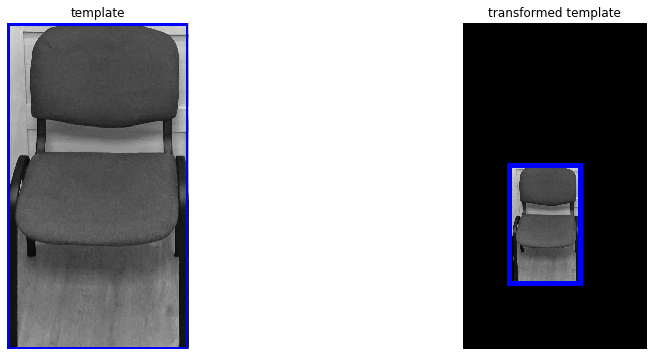

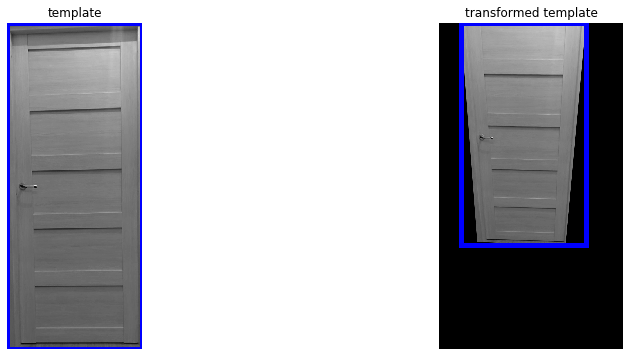

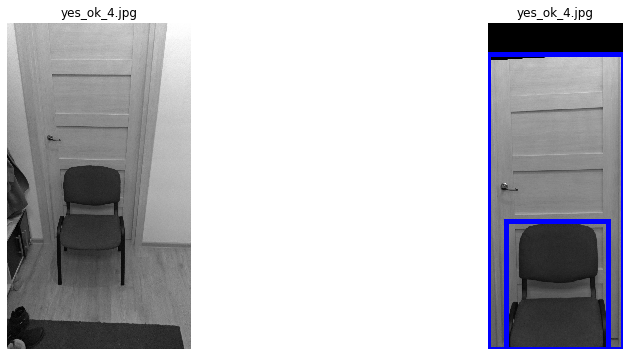

Yes : yes_ok_4.jpg


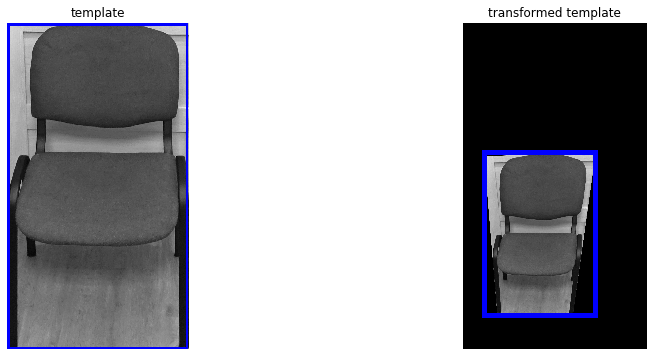

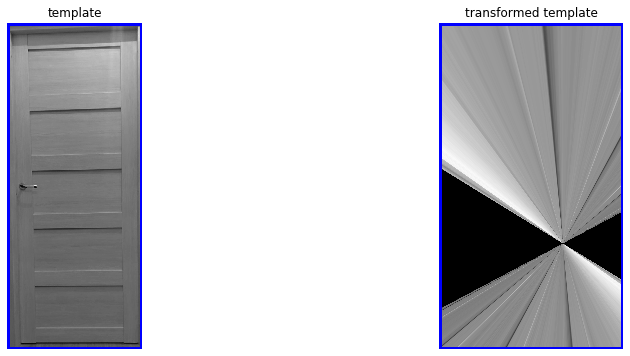

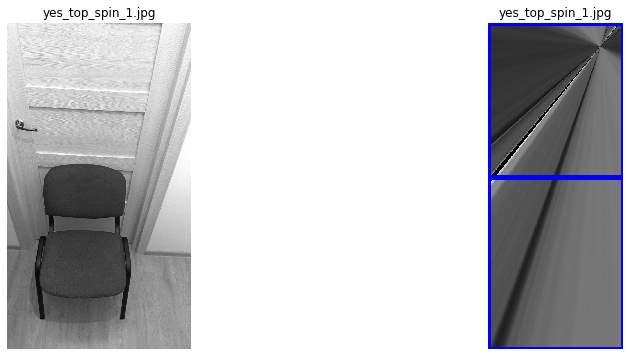

No  : yes_top_spin_1.jpg


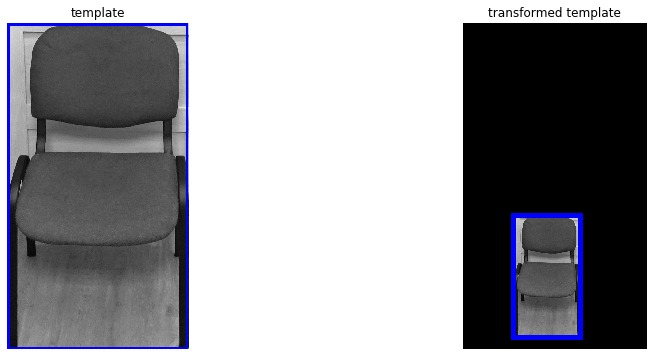

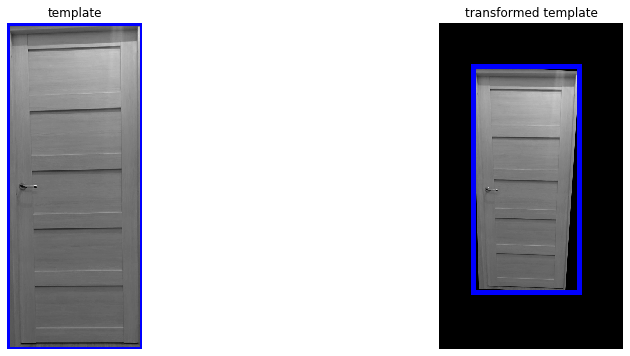

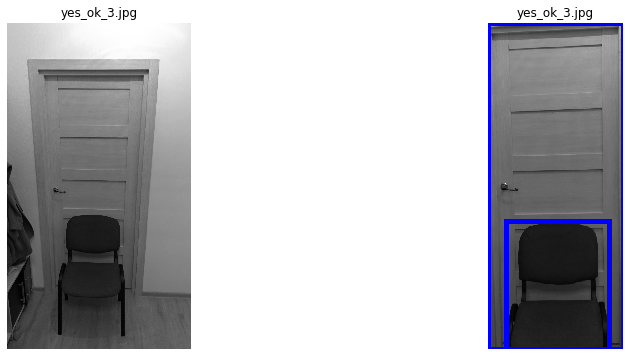

Yes : yes_ok_3.jpg


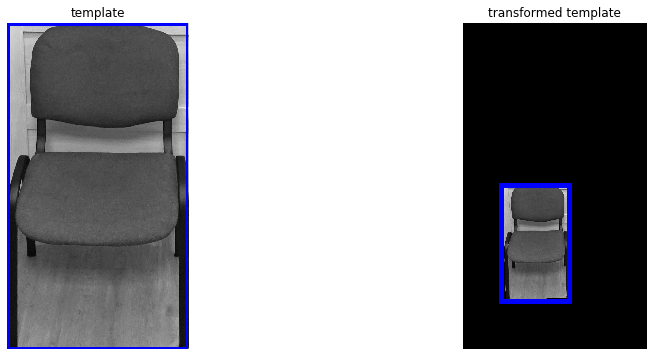

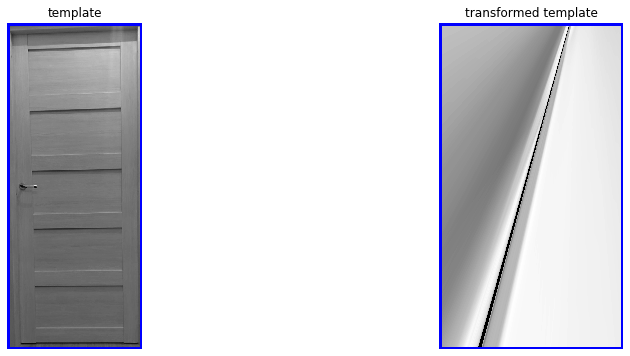

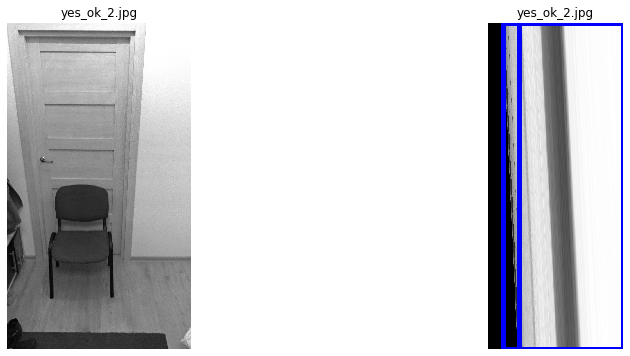

Yes : yes_ok_2.jpg


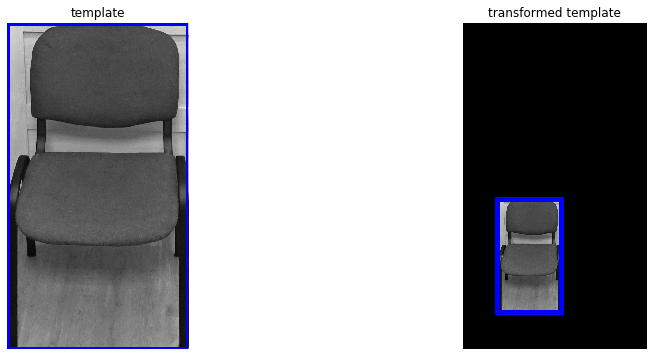

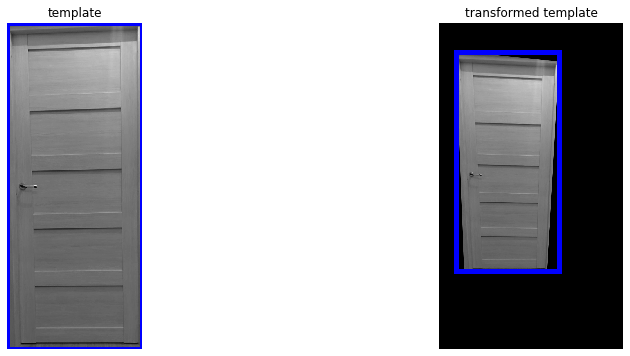

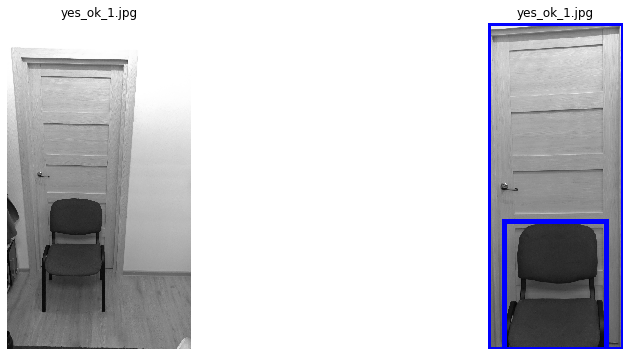

Yes : yes_ok_1.jpg


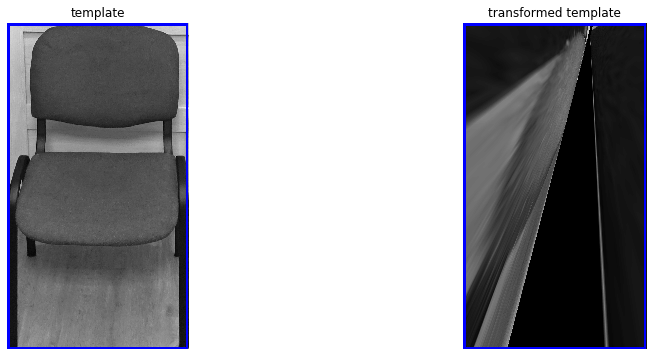

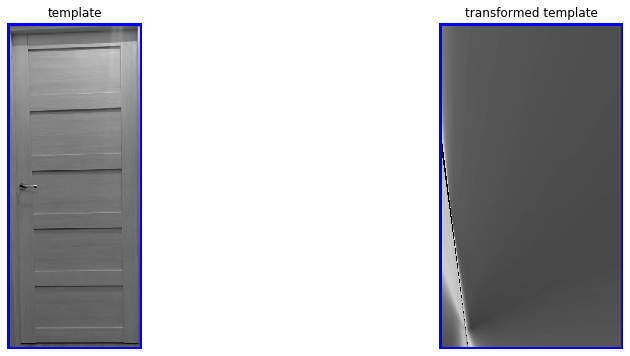

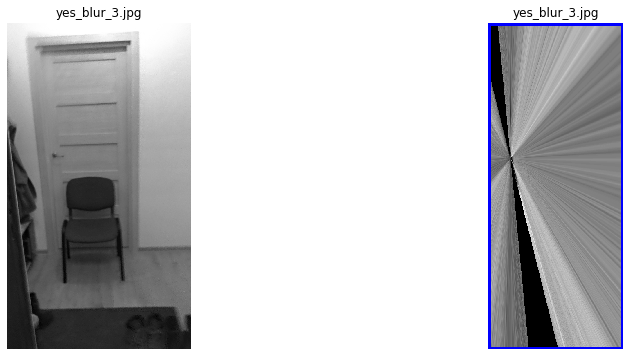

No  : yes_blur_3.jpg


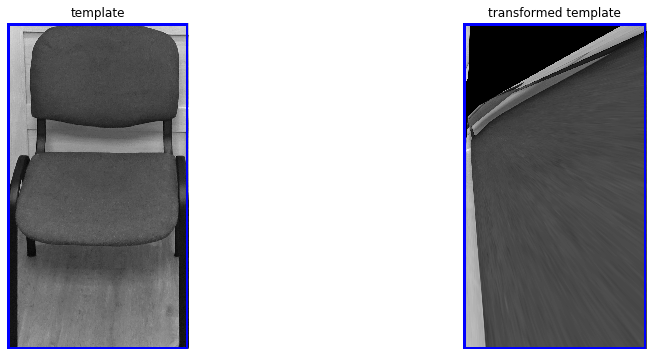

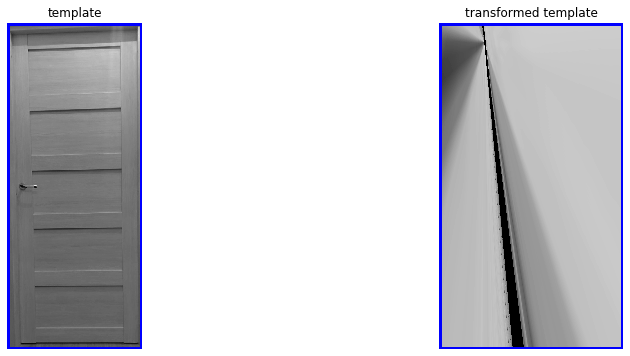

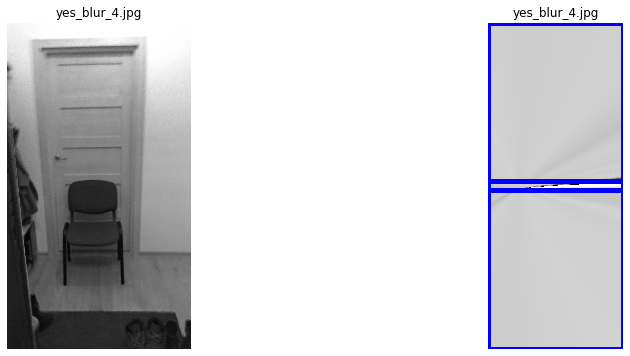

No  : yes_blur_4.jpg


In [49]:
from matplotlib import pyplot as plt
from imageio import imread, imsave
from skimage.color import rgb2gray
import numpy as np
from skimage.feature import canny
from skimage.filters import try_all_threshold
from skimage.filters import gaussian
from skimage.filters import threshold_otsu, rank
from skimage.filters import threshold_triangle
from skimage.morphology import disk
from skimage.morphology import binary_closing
from skimage.morphology import binary_opening
from skimage.util import img_as_ubyte
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line
import cv2
from scipy.ndimage.morphology import binary_fill_holes
from matplotlib.patches import Rectangle

def get_border(mask):
    vertical_indices = np.where(np.any(mask, axis=1))[0]
    top, bottom = vertical_indices[0], vertical_indices[-1]
    horizontal_indices = np.where(np.any(mask, axis=0))[0]
    left, right = horizontal_indices[0], horizontal_indices[-1]
    corner = (left, top)
    height = bottom - top
    width = right - left
    rect_border = Rectangle(corner, width, height, linewidth=5, edgecolor='b', facecolor='none')
    return rect_border


def crop_by_border(img, border):
    return img[border[0]:border[1], border[2]:border[3]]


def select_chair():
    chair_name = "yes_ok_1.jpg"
    chair_img = imread("%s\\%s" % (dataset_path, chair_name))
    '''
    plt.imshow(chair_img)
    plt.show()
    '''
    first_border = [2000, 3500, 200, 1500]
    chair_img_crop = crop_by_border(chair_img, first_border)
    '''
    plt.imshow(chair_img_crop)
    plt.show()
    '''
    chair_img_crop_gray = rgb2gray(chair_img_crop)
    thresh = threshold_triangle(chair_img_crop_gray)
    chair_img_crop_gray_binary = chair_img_crop_gray > thresh
    chair_img_crop_gray_binary = binary_opening(chair_img_crop_gray_binary, selem=np.ones((5, 5)))
    chair_img_crop_gray_binary = binary_closing(chair_img_crop_gray_binary, selem=np.ones((10, 10)))
    '''
    plt.imshow(chair_img_crop_gray_binary, cmap="gray")
    plt.show()
    '''
    border = get_border(1 - chair_img_crop_gray_binary)
    '''
    fig, ax = plt.subplots(1, 1, figsize=(15, 6))
    ax.imshow(chair_img_crop_gray_binary, cmap='gray')
    ax.add_patch(border)
    plt.show()
    '''
    chair_border = [first_border[0] + border.get_y(), first_border[0] + border.get_y() + border.get_height(),
                    first_border[2] + border.get_x(), first_border[2] + border.get_x() + border.get_width()]
    selected_chair = crop_by_border(chair_img, chair_border)
    '''
    plt.imshow(selected_chair)
    plt.show()
    '''
    return selected_chair, chair_border


def select_door():
    door_name = "door_only.jpg"
    door_img = imread("%s\\%s" % (dataset_path, door_name))
    door_border = [70, 870, 150, 480]
    door_img_crop = crop_by_border(door_img, door_border)
    '''
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].imshow(door_img)
    ax[1].imshow(door_img_crop)
    plt.show()
    '''
    selected_door = door_img_crop
    return selected_door, door_border


def my_find_homography(img_1_gray, img_2_gray):
    '''
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')
    plt.show()
    '''
    orb_detector = cv2.ORB_create(5000)

    kp1, d1 = orb_detector.detectAndCompute(img_1_gray, None)
    kp2, d2 = orb_detector.detectAndCompute(img_2_gray, None)

    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = matcher.match(d1, d2)
    matches_length = len(matches)
    p1 = np.zeros((matches_length, 2))
    p2 = np.zeros((matches_length, 2))
    for i in range(matches_length):
        p1[i, :] = kp1[matches[i].queryIdx].pt
        p2[i, :] = kp2[matches[i].trainIdx].pt
    '''
    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('box')
    ax[0].imshow(img_1_gray, cmap='gray')
    ax[0].plot(p1[:, 0], p1[:, 1], "o")

    ax[1].set_title('compos')
    ax[1].imshow(img_2_gray, cmap='gray')
    ax[1].plot(p2[:, 0], p2[:, 1], "o")
    plt.show()
    '''
    homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
    return homography, mask


def highlight_obj_by_template(img_gray, template_img_gray):
    height, width = img_gray.shape
    homography, _ = my_find_homography(template_img_gray, img)
    mask = np.ones(template_img_gray.shape)
    transformed_mask = cv2.warpPerspective(mask, homography, (width, height))
    transformed_template = cv2.warpPerspective(template_img_gray, homography, (width, height))

    fig, ax = plt.subplots(1, 2, figsize=(15, 6))
    ax[0].set_title('template')
    ax[0].axis('off')
    ax[0].imshow(template_img_gray, cmap='gray')
    border = get_border(mask)
    ax[0].add_patch(border)

    ax[1].set_title('transformed template')
    ax[1].axis('off')
    ax[1].imshow(transformed_template, cmap='gray')
    border = get_border(transformed_mask)
    ax[1].add_patch(border)
    plt.show()
    return transformed_mask, transformed_template


def perspective_offset(img, door_template, chair_template):
    height, width = img.shape

    chair_transformed_mask, chair_transformed_template = highlight_obj_by_template(img, chair_template)
    door_transformed_mask, door_transformed_template = highlight_obj_by_template(img, door_template)

    homography, mask = my_find_homography(door_transformed_template, door_template)
    height, width = door_template.shape
    door_non_perspective_mask = cv2.warpPerspective(door_transformed_mask, homography, (width, height))
    non_perspective_img = cv2.warpPerspective(img, homography, (width, height))
    chair_non_perspective_mask = cv2.warpPerspective(chair_transformed_mask, homography, (width, height))

    return non_perspective_img, door_non_perspective_mask, chair_non_perspective_mask, 


# TODO скорее всего, матрицу обратного преобразования мужно найти при помощи матричных операций
# TODO скорее всего, вместо преобразования маски можно преобразовывать прямогольники, однако, если маска будет более
#  сложной формы, то прямоугольником уже не обойтись
# TODO добавить возможность сравнивать больше чем с 1 шаблоном
if __name__ == "__main__":
    door_template, door_template_border = select_door()
    chair_template, chair_template_border = select_chair()
    door_template_gray = cv2.cvtColor(door_template, cv2.COLOR_BGR2GRAY)
    chair_template_gray = cv2.cvtColor(chair_template, cv2.COLOR_BGR2GRAY)

    img_dataset_name = ["yes_ok_4.jpg", "yes_top_spin_1.jpg", "yes_ok_3.jpg", "yes_ok_2.jpg", "yes_ok_1.jpg", "yes_blur_3.jpg", "yes_blur_4.jpg"]
    for name in img_dataset_name:
        img = cv2.imread("%s\\%s" % (dataset_path, name))
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        non_perspective_img, non_perspective_door_mask, non_perspective_chair_mask = perspective_offset(img_gray, door_template_gray, chair_template_gray)

        fig, ax = plt.subplots(1, 2, figsize=(15, 6))
        ax[0].set_title('%s' % name)
        ax[0].imshow(img_gray, cmap='gray')
        ax[0].axis('off')
        
        ax[1].set_title('%s' % name)
        ax[1].axis('off')
        ax[1].imshow(non_perspective_img, cmap='gray')
        chair_non_perspective_border = get_border(non_perspective_chair_mask)
        ax[1].add_patch(chair_non_perspective_border)
        door_non_perspective_border = get_border(non_perspective_door_mask)
        ax[1].add_patch(door_non_perspective_border)
        plt.show()
        if (door_non_perspective_border.get_width() > chair_non_perspective_border.get_width()):
            print("Yes : %s" % name) 
        else:
            print("No  : %s" % name)










































